In [256]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# Question 1

## 1.1
#### Each pixel for every colour takes 8 bits = 1 Byte.
#### Now since it is a colour image hence each pixel will take 3 Bytes.
#### Given that the ratio of height to width is 4:3 we can assume that there are 4x pixels in height and 3x pixels in the width.
#### Now given that each pixel is 3 Bytes and there are (4x * 3x) pixels.
#### Now we equare them given that the file size is 5.76 MB = 5760000 Bytes.
#### Equating we get the equation 3 * (4x * 3x) = 5760000 .
#### This implies x = 400 .
#### Since width = 3x pixels and height = 4x pixels, the dimension of the image is 1600*900 pixels.

## 1.2
#### Let the Bytes required for one pixel in each case be p.
#### Now given that it is a square image of 5200*5200 pixels and he takes 2000 images.
#### The total memory required will be 5200*5200*p*2000 .
#### Given he has 64 GB memory cards assuming he requires x memory cards.
#### The generalised equation will be 64*10^9*x = 5408*10^7*p
#### x = 5408*10^7*p/64*10^9
#### x = 0.845*p
#### 
### Part (a)
#### In this the image is a black and white image afd hence requires only 1 bit per pixel.
#### Hence in this case p = 1/8 .
#### Substituting this we get x = 0.845/8 = 0.106 .
#### Rounding up the value we get that only 1 Memory card will be required.
#### 
### Part (b)
#### In this the image is a grayscale image and hence requires 1 Byte per pixel.
#### Hence in this case p = 1 .
#### Substituting this we get x = 0.845*1 = 0.845 .
#### Rounding up the value we get that only 1 Memory card will be required.
#### 
### Part (c)
#### In this the image is a colour image and hence requires only 3 Bytes per pixel(1 for red,green and blue.
#### Hence in this case p = 3 .
#### Substituting this we get x = 0.845*3 = 2.535 .
#### Rounding up the value we need 3 Memory cards.

## 1.3
#### The reason for the pixels to be individually distinguishable on the bill board is that the number of pixels in a unit area is lesser as compared to that on a desktop screen. The reason for that is the for the image the number of pixels in width and height remain same for desktop and bill board but the number of pixels per inch (ppi) is greater in case of desktop due to its small screen size. PPI is a concept of resolution. This was the reason why the image was less when displayed on bill board.

# Question 2

In [257]:
img = cv2.imread('./Images/img_2.1.jpg')

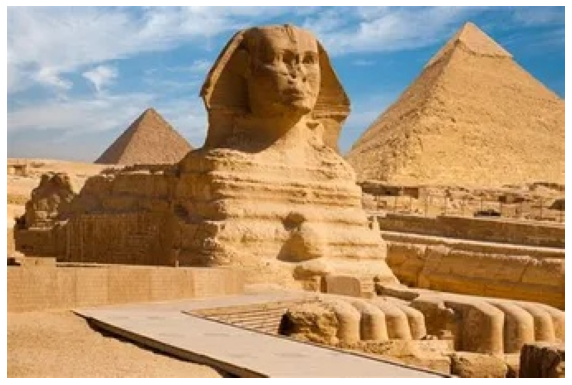

In [258]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB);

plt.figure()

plt.imshow(img)
plt.axis("off")
plt.gcf().set_size_inches(10, 10)
plt.show()

In [259]:
a = img.shape
row = a[0]
col = a[1]

R=0
G=0
B=0

for i in range(row):
    for j in range(col):
        R = R+img[i,j,0]
        G = G+img[i,j,1]
        B = B+img[i,j,2]
        
R = R/(row*col)
G = G/(row*col)
B = B/(row*col)

print(R," ",G," ",B)

172.4511768573307   143.23644970414202   110.3804339250493


#### Red is the most frequently occuring color in this image among RGB as the color mean of each pixel is maximum for Red.

In [260]:
def mergeImage(fg, bg):
    a = fg.shape;

    row = a[0]
    col = a[1]

    result = fg

    for i in range(row):
        for j in range(col):
            r = int(fg[i,j,0])
            g = int(fg[i,j,1])
            b = int(fg[i,j,2])
            if(r+b<g):
                result[i,j] = bg[i,j]
                
    return result

In [261]:
fore = cv2.imread('./Images/foreground.png')
back = cv2.imread('./Images/background.png')

fore = cv2.cvtColor(fore, cv2.COLOR_BGR2RGB);
back = cv2.cvtColor(back, cv2.COLOR_BGR2RGB);

fore = cv2.resize(fore, (1200,900))
back = cv2.resize(back, (1200,900))

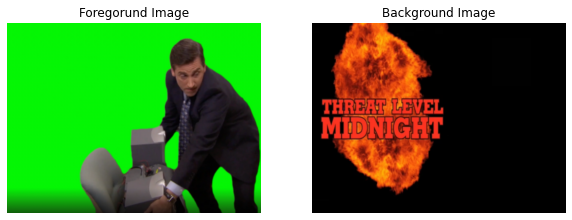

In [262]:
plt.figure()

plt.subplot(121)
plt.axis("off")
plt.title("Foregorund Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(fore)

plt.subplot(122)
plt.axis("off")
plt.title("Background Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(back)

plt.show()

In [263]:
merged_img = mergeImage(fore,back)

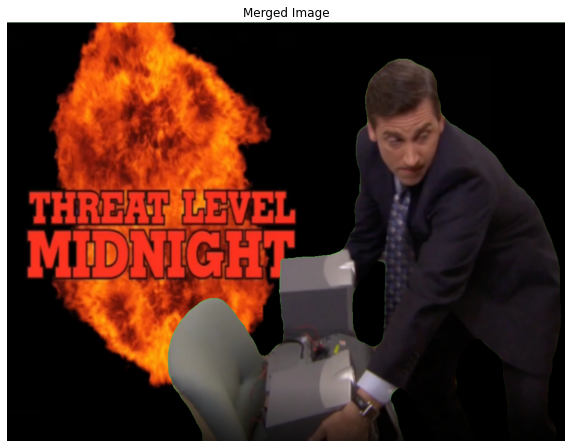

In [264]:
plt.figure()

plt.imshow(merged_img)
plt.axis("off")
plt.title("Merged Image")
plt.gcf().set_size_inches(10, 10)
plt.show()

# Question 3

In [460]:
def piecewiseLinTransform(a,b,k1,k2,img):
    row = img.shape[0]
    col = img.shape[1]
    size = a.shape[0]
    
    for i in range(row):
        for j in range(col):
            for k in range(size):
                if(img[i][j]>=a[k] and img[i][j]<=b[k]):
                    img[i][j] = k1[k]*img[i][j] + k2[k]
                    break
    
    return img

In [461]:
img1 = cv2.imread('./Images/pam1.png',0)
img2 = cv2.imread('./Images/pam2.png',0)

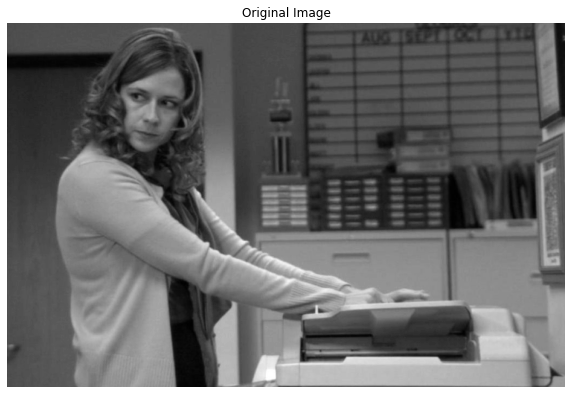

In [462]:
plt.figure()

plt.axis("off")
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img1, cmap='gray')

plt.show()

In [463]:
a = np.array([0.0,0.2,0.4])
b = np.array([0.2,0.4,1.0])

k1 = np.array([2,-1,1])
k2 = np.array([0.1,0.7,-0.1])

In [464]:
img1 = img1/255
trans_img1 = piecewiseLinTransform(a,b,k1,k2,img1)
trans_img1 = trans_img1*255

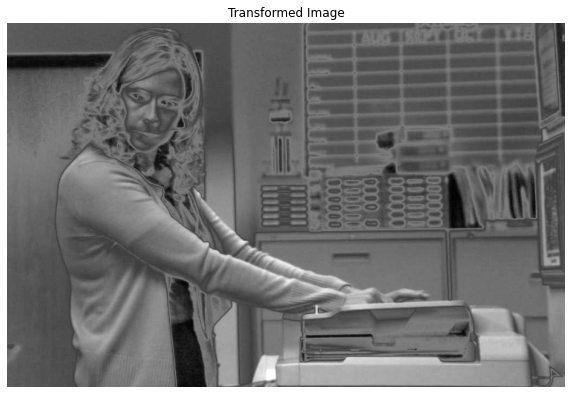

In [465]:
plt.figure()

plt.axis("off")
plt.title("Transformed Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(trans_img1, cmap='gray')

plt.show()

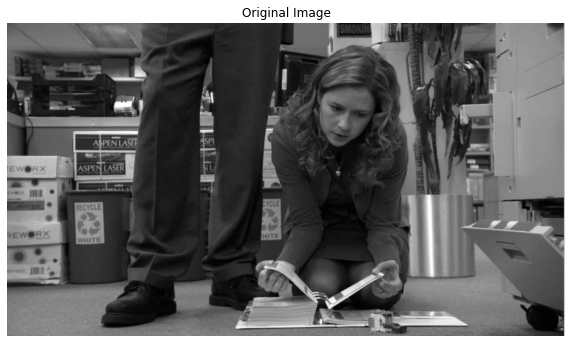

In [271]:
plt.figure()

plt.axis("off")
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img2, cmap='gray')

plt.show()

In [272]:
a = np.array([0.0,0.2,0.4,0.6,0.8])
b = np.array([0.2,0.4,0.6,0.8,1.0])

k1 = np.array([0,0,0,0,0])
k2 = np.array([0,0.2,0.4,0.6,0.8])

In [273]:
img2 = img2/255
trans_img2 = piecewiseLinTransform(a,b,k1,k2,img2)
trans_img2 = trans_img2*255

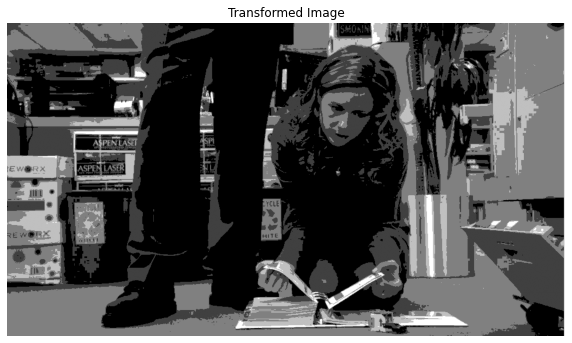

In [274]:
plt.figure()

plt.axis("off")
plt.title("Transformed Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(trans_img2, cmap='gray')

plt.show()

In [275]:
img3 = cv2.imread('./Images/pam3.png',0)

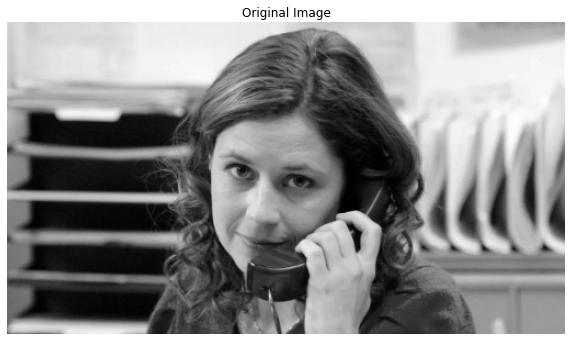

In [276]:
plt.figure()

plt.axis("off")
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img3, cmap='gray')

plt.show()

In [277]:
a = np.array([0.0,0.2,0.3,0.5,0.6,0.8])
b = np.array([0.2,0.3,0.5,0.6,0.8,1.0])

k1 = np.array([1,-2,1,-2,1,-2])
k2 = np.array([0,0.2,-0.3,1.2,-0.6,1.8])

In [278]:
img3 = img3/255
trans_img3 = piecewiseLinTransform(a,b,k1,k2,img3)
trans_img3 = trans_img3*255

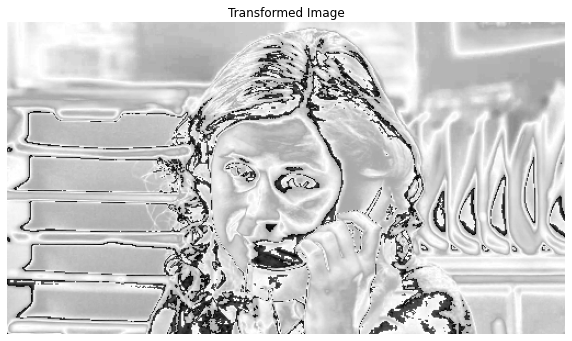

In [279]:
plt.figure()

plt.axis("off")
plt.title("Transformed Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(trans_img3, cmap='gray')

plt.show()

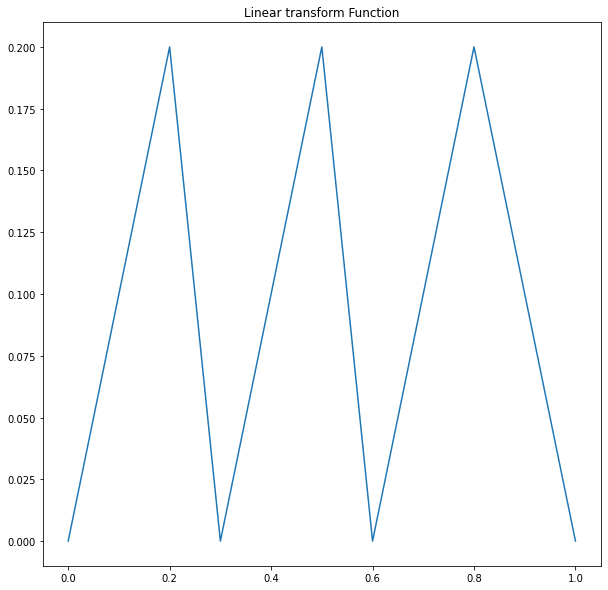

In [280]:
y = np.array([0.0,0.2,0.0,0.2,0.0,0.2,0.0])
x = np.array([0.0,0.2,0.3,0.5,0.6,0.8,1.0])

plt.figure()

plt.title("Linear transform Function")
plt.gcf().set_size_inches(10, 10)
plt.plot(x,y)

plt.show()

##### 1. Choose a desired linear function.
##### 2. Obtain A,B,K1,K2 from the graph where K1 is slope, K2 is intercept and A and B are the piece wise slot where the equation changes.
##### 3. Implement the piecewiseLinTransform on the selected image.

# Question 4

In [281]:
def bitSlice(img, k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    img_k = np.zeros([row, col], dtype=int)
    
    for i in range(row):
        for j in range(col):
            binary = np.binary_repr(img[i][j], width=8)
            img_k[i][j] = binary[8-k]
            
    img_k = img_k*np.power(2,k-1)
    return img_k

In [282]:
img1 = cv2.imread('./Images/rupee.jpg',0)
img2 = cv2.imread('./Images/securityThreat.jpg',0)
img3 = cv2.imread('./Images/pepper.jpg',0)

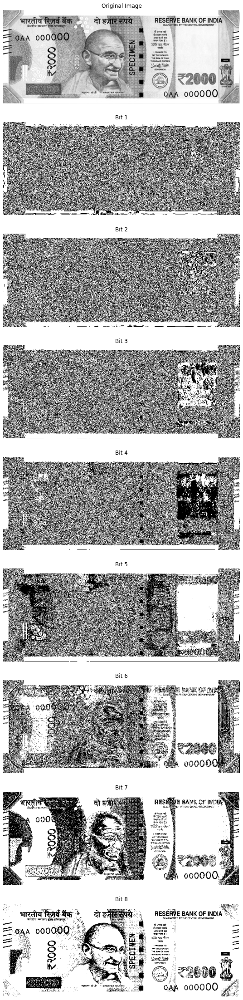

In [283]:
f = plt.figure()
f.set_figwidth(60)
f.set_figheight(40)

plt.subplot(9,1,1)
plt.axis("off");
plt.title("Original Image")
plt.imshow(img1, cmap = 'gray')

for i in range(1,9):
    img = bitSlice(img1, i)
    plt.subplot(9,1,i+1)
    plt.axis("off")
    plt.title("Bit " + str(i))
    plt.imshow(img, cmap = 'gray')
    
plt.show();

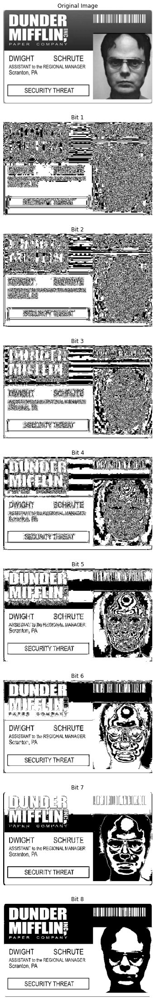

In [284]:
f = plt.figure()
f.set_figwidth(60)
f.set_figheight(40)

plt.subplot(9,1,1)
plt.axis("off");
plt.title("Original Image")
plt.imshow(img2, cmap = 'gray')

for i in range(1,9):
    img = bitSlice(img2, i)
    plt.subplot(9,1,i+1)
    plt.axis("off")
    plt.title("Bit " + str(i))
    plt.imshow(img, cmap = 'gray')
    
plt.show();

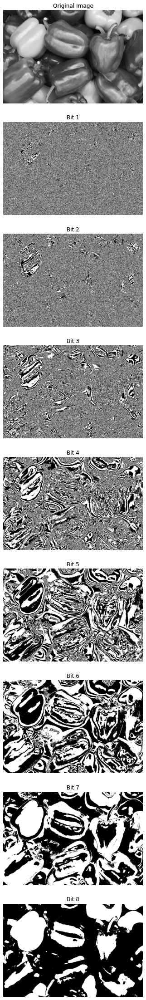

In [285]:
f = plt.figure()
f.set_figwidth(60)
f.set_figheight(40)

plt.subplot(9,1,1)
plt.axis("off");
plt.title("Original Image")
plt.imshow(img3, cmap = 'gray')

for i in range(1,9):
    img = bitSlice(img3, i)
    plt.subplot(9,1,i+1)
    plt.axis("off")
    plt.title("Bit " + str(i))
    plt.imshow(img, cmap = 'gray')
    
plt.show();

In [286]:
def imgBitQuantizer(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    quan_img = np.zeros([row,col], dtype = int)
    
    for i in range(k):
        img_k = bitSlice(img,8-i)
        quan_img += img_k
        
    return quan_img

In [287]:
img1 = cv2.imread('./Images/rupee.jpg',0)
img2 = cv2.imread('./Images/securityThreat.jpg',0)
img3 = cv2.imread('./Images/pepper.jpg',0)

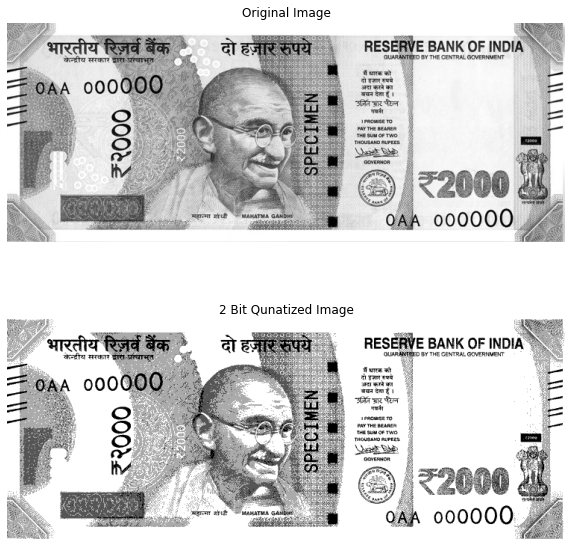

In [288]:
k = 2
quant_img = imgBitQuantizer(img1,k)

plt.figure()


plt.subplot(211)
plt.axis("off");
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img1, cmap = 'gray')


plt.subplot(212)
plt.axis("off");
plt.title(str(k) + " Bit Qunatized Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(quant_img, cmap = 'gray')

plt.show()

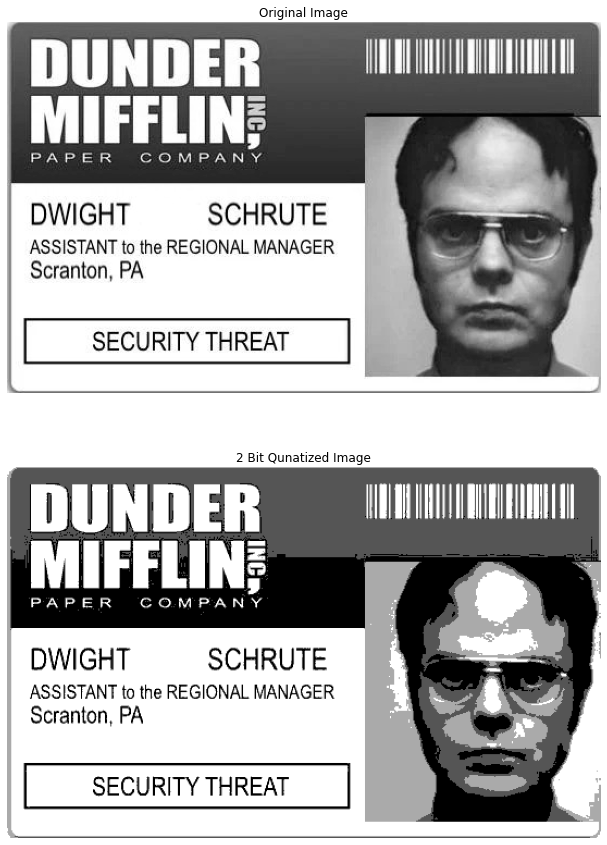

In [289]:
k = 2
quant_img = imgBitQuantizer(img2,k)

f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)


plt.subplot(211)
plt.axis("off");
plt.title("Original Image")
#plt.gcf().set_size_inches(10, 10)
plt.imshow(img2, cmap = 'gray')


plt.subplot(212)
plt.axis("off");
plt.title(str(k) + " Bit Qunatized Image")
#plt.gcf().set_size_inches(10, 10)
plt.imshow(quant_img, cmap = 'gray')

plt.show()

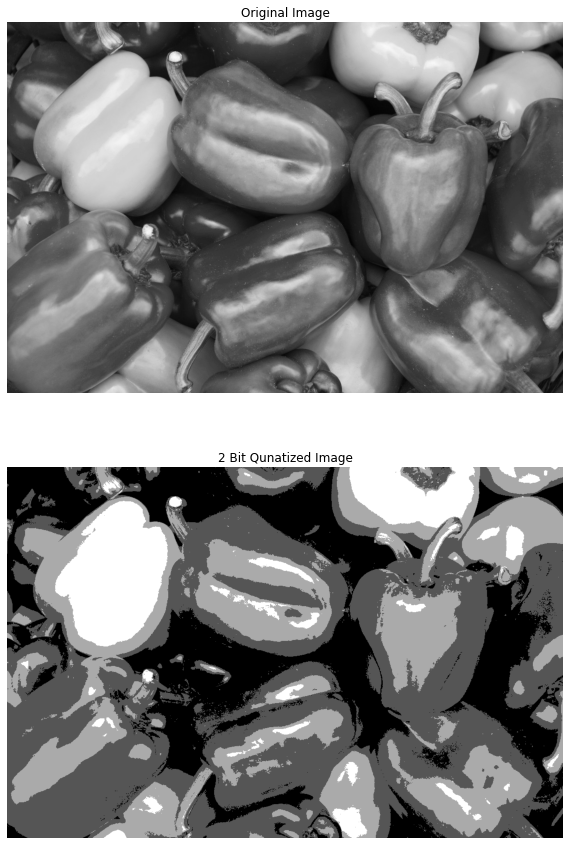

In [290]:
k = 2
quant_img = imgBitQuantizer(img3,k)

f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(211)
plt.axis("off");
plt.title("Original Image")
plt.imshow(img3, cmap = 'gray')


plt.subplot(212)
plt.axis("off");
plt.title(str(k) + " Bit Qunatized Image")
plt.imshow(quant_img, cmap = 'gray')

plt.show()

##### From 4.2 we can observe that the most significant bit of the image i.e. 8 in this case carries most of the information and decrese gradually as we go to bit 1 which  contains least of the information.
##### From 4.4 we can observe that as we quantize the image, the information and quality of the image does not get affected by much as quantizing the image to 4 bits from 8 bits removes bit 1,2,3 and 4. Hence it compresses the image with bits 5,6,7 and 8 which contains most of the information.

### part 5 (Bonus)
#### Application of bit plane slicing is compressing the image size, as most of the information is contained in the MSB's thus we can slice off the LSB's and compress the image size without losing the information contained in the image

# Question 5

### part (a) 
#### Range of gamma is [0,inf) .
#### 
### part (b)
#### If gamma is in the range of [0,inf) then c=1 will give the transformed pixel intensity within the 8-bit range but when gamma < 0 then the range will get bigger than 255 thus in this case we have to take c = 1/max(r)^gamma .
#### 
### part (c)

In [291]:
x = np.arange(1001)
x = x/1000

In [292]:
g1 = np.power(x,0.5)
g2 = np.power(x,1)
g3 = np.power(x,2)

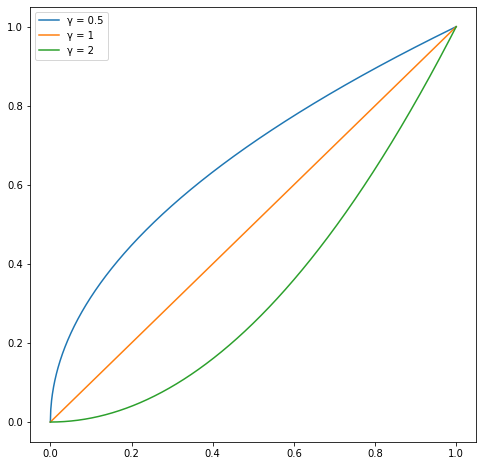

In [293]:
plt.figure()

plt.plot(x,g1)
plt.plot(x,g2)
plt.plot(x,g3)

plt.gcf().set_size_inches(8, 8)

plt.legend(["γ = 0.5", "γ = 1", "γ = 2"])

plt.show()

In [294]:
def powerLawTransform(img,c,gamma):
    img = img/255
    
    row = img.shape[0]
    col = img.shape[1]
    
    output_img = np.zeros([row,col], dtype = object)
    
    for i in range(row):
        for j in range(col):
            output_img[i][j] = c*np.power(img[i][j],gamma)
    
    output_img = output_img*255
    
    return output_img.astype(np.uint8)

In [295]:
img1 = cv2.imread('./Images/scrantonAreal.png',0)
img2 = cv2.imread('./Images/tripGrpPhoto.png',0)

In [296]:
transformed_img1 = powerLawTransform(img1,1,0.15)
transformed_img2 = powerLawTransform(img1,1,1)
transformed_img3 = powerLawTransform(img1,1,8)

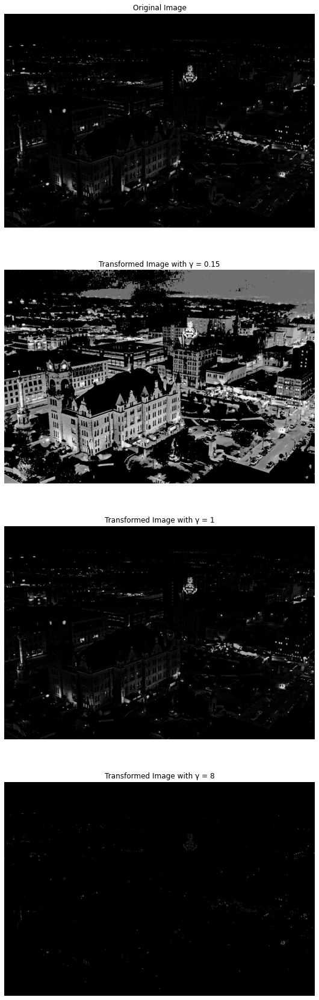

In [297]:
f = plt.figure()
f.set_figwidth(50)
f.set_figheight(30)


plt.subplot(411)
plt.axis("off")
plt.title("Original Image")
plt.imshow(img1, cmap = 'gray')

plt.subplot(412)
plt.axis("off")
plt.title("Transformed Image with γ = 0.15")
plt.imshow(transformed_img1, cmap = 'gray')

plt.subplot(413)
plt.axis("off")
plt.title("Transformed Image with γ = 1")
plt.imshow(transformed_img2, cmap = 'gray')

plt.subplot(414)
plt.axis("off")
plt.title("Transformed Image with γ = 8")
plt.imshow(transformed_img3, cmap = 'gray')

plt.show()

In [298]:
transformed_img1 = powerLawTransform(img2,1,0.15)
transformed_img2 = powerLawTransform(img2,1,1)
transformed_img3 = powerLawTransform(img2,1,8)

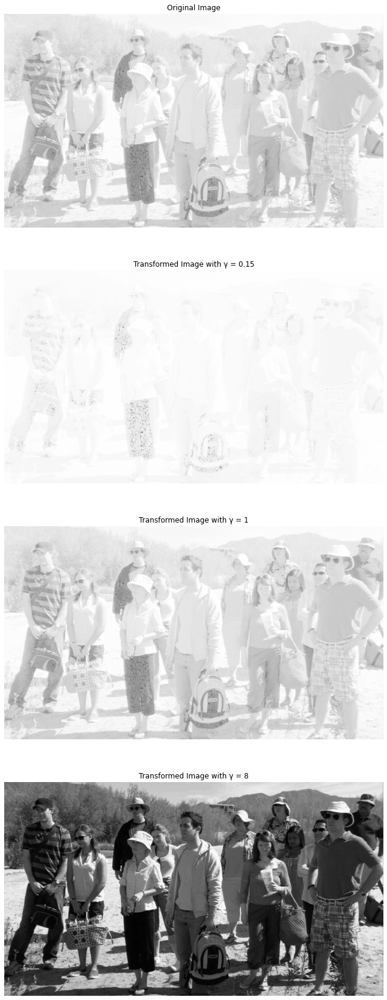

In [299]:
f = plt.figure()
f.set_figwidth(50)
f.set_figheight(30)


plt.subplot(411)
plt.axis("off")
plt.title("Original Image")
plt.imshow(img2, cmap = 'gray')

plt.subplot(412)
plt.axis("off")
plt.title("Transformed Image with γ = 0.15")
plt.imshow(transformed_img1, cmap = 'gray')

plt.subplot(413)
plt.axis("off")
plt.title("Transformed Image with γ = 1")
plt.imshow(transformed_img2, cmap = 'gray')

plt.subplot(414)
plt.axis("off")
plt.title("Transformed Image with γ = 8")
plt.imshow(transformed_img3, cmap = 'gray')

plt.show()

##### Log Transform is magical transfrom and it is denoted by s = c*log(1+r) where c is a constant which has a value -> 255/(log(1+max pixel value)) .

In [300]:
x = np.arange(256)

In [301]:
c = 255.0/np.log(256)

funct = c*np.log(1+x)

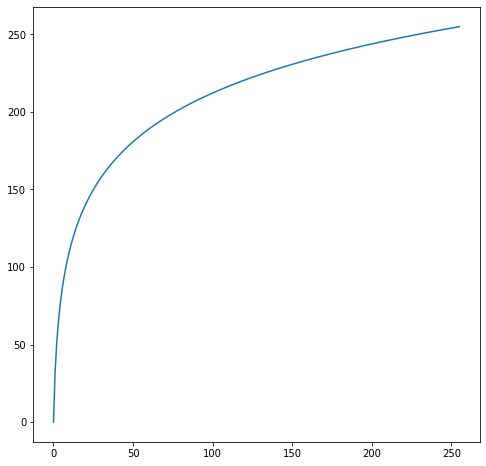

In [302]:
plt.figure()

plt.plot(x,funct)
plt.gcf().set_size_inches(8, 8)

plt.show()

In [303]:
def logTransform(img,c):
    
    row = img.shape[0]
    col = img.shape[1]
    
    output_img = np.zeros([row,col], dtype = float)
    
    for i in range(row):
        for j in range(col):
            output_img[i][j] = c*np.log(1+img[i][j])
            
    return output_img.astype(np.uint8)

In [304]:
mx = np.amax(img1)

c = 255.0/np.log(1+mx)

transformed_img = logTransform(img1,c)

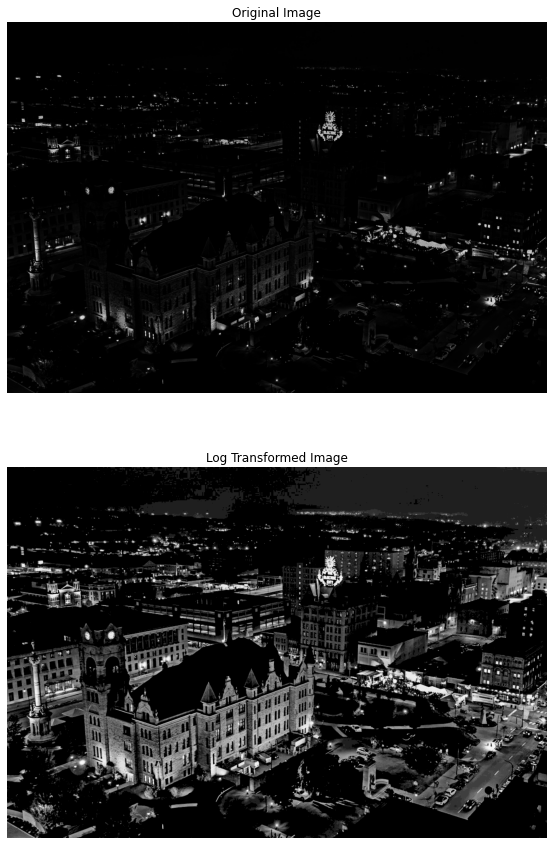

In [305]:
f = plt.figure()
f.set_figwidth(25)
f.set_figheight(15)

plt.subplot(211)
plt.axis("off")
plt.title("Original Image")
plt.imshow(img1, cmap = 'gray')

plt.subplot(212)
plt.axis("off")
plt.title("Log Transformed Image")
plt.imshow(transformed_img, cmap = 'gray')

plt.show()

##### Log Transformed image is much sharper as compared to gamma transfromed image whereas gamma transformed image is much brighter as compared to log transformed image.

# Question 6

In [306]:
def histEqualization(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    prob = np.zeros(256, dtype = int)
    
    for i in range(row):
        for j in range(col):
            prob[img[i][j]] += 1
    
    prob = prob/(row*col)
    
    cumulative_prob = np.zeros(256, dtype = float)
    
    cumulative_prob[0] = prob[0]
    
    for k in range(1,256):
        cumulative_prob[k] = prob[k]+cumulative_prob[k-1]
        
    matching = np.zeros(256, dtype = int)
    
    for k in range(256):
        matching[k] = round(255*cumulative_prob[k-1])
        
    output_img = np.zeros([row,col], dtype = int)
    
    for i in range(row):
        for j in range(col):
            output_img[i][j] = matching[img[i][j]]
            
    return output_img

In [307]:
img1 = cv2.imread('./Images/Same_picture.png',0)

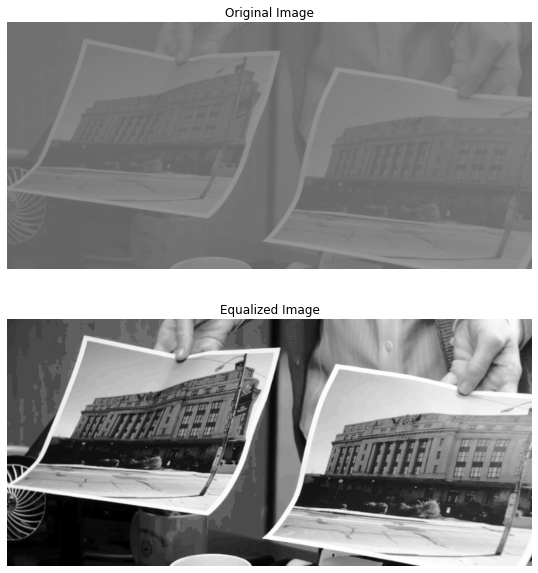

In [308]:
equalized_img = histEqualization(img1)

plt.figure()


plt.subplot(211)
plt.axis("off");
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img1, vmin=0, vmax=255, cmap = 'gray')


plt.subplot(212)
plt.axis("off");
plt.title("Equalized Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(equalized_img, vmin=0, vmax=255, cmap = 'gray')

plt.show()

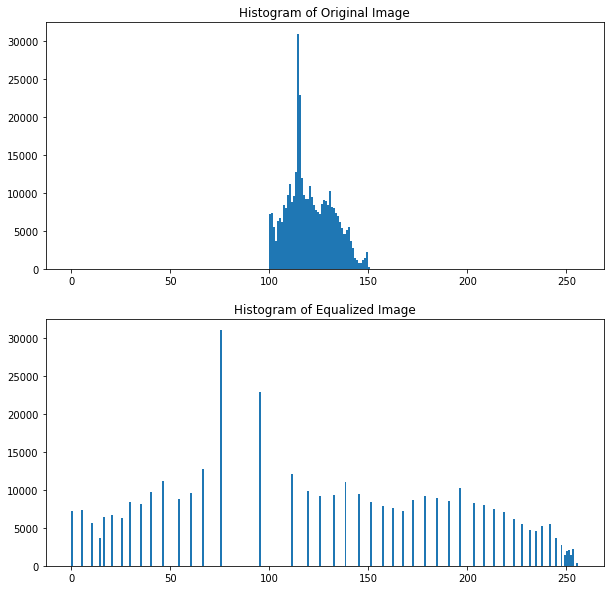

In [309]:
plt.figure()

plt.subplot(211)
plt.title("Histogram of Original Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(img1.ravel(), 256, [0,256])

plt.subplot(212)
plt.title("Histogram of Equalized Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(equalized_img.ravel(), 256, [0,256])

plt.show()

##### Input image contains intensity value of the pixel in certain range and on the other hand the resultant image intensity value is widely spread across the range due to which we are able to see the resultant image more clearly.

In [310]:
def histMatching(img, ref_img):
    
    eq_img = histEqualization(img)
    
    row = ref_img.shape[0]
    col = ref_img.shape[1]
    
    prob = np.zeros(256, dtype = int)
    
    for i in range(row):
        for j in range(col):
            prob[ref_img[i][j]] += 1
    
    prob = prob/(row*col)
    
    cumulative_prob = np.zeros(256, dtype = float)
    
    cumulative_prob[0] = prob[0]
    
    for k in range(1,256):
        cumulative_prob[k] = prob[k]+cumulative_prob[k-1]
        
    eq_img = eq_img/255
    
    out_img = np.searchsorted(cumulative_prob, eq_img)
    
    return out_img

In [311]:
img1 = cv2.imread('./Images/Creed.png',0)
img2 = cv2.imread('./Images/Texture.jpg',0)

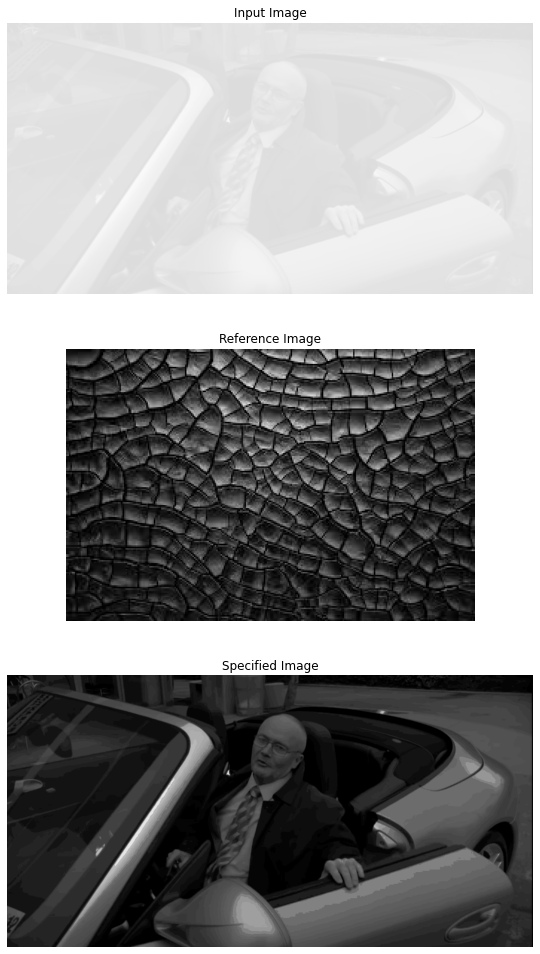

In [312]:
spec_img = histMatching(img1,img2)

f = plt.figure()
f.set_figwidth(35)
f.set_figheight(17)

plt.subplot(311)
plt.axis("off");
plt.title("Input Image")
plt.imshow(img1, vmin=0, vmax=255, cmap = 'gray')

plt.subplot(312)
plt.axis("off");
plt.title("Reference Image")
plt.imshow(img2, vmin=0, vmax=255, cmap = 'gray')

plt.subplot(313)
plt.axis("off");
plt.title("Specified Image")
plt.imshow(spec_img, vmin=0, vmax=255, cmap = 'gray')

plt.show()

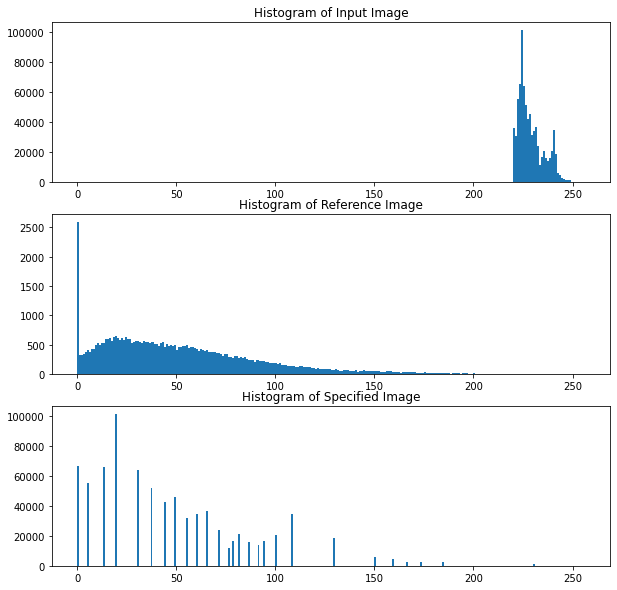

In [313]:
plt.figure()

plt.subplot(311)
plt.title("Histogram of Input Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(img1.ravel(), 256, [0,256])

plt.subplot(312)
plt.title("Histogram of Reference Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(img2.ravel(), 256, [0,256])

plt.subplot(313)
plt.title("Histogram of Specified Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(spec_img.ravel(), 256, [0,256])

plt.show()

In [314]:
img1 = cv2.imread('./Images/img_6.1.png',0)
img2 = cv2.imread('./Images/img_6.2.png',0)

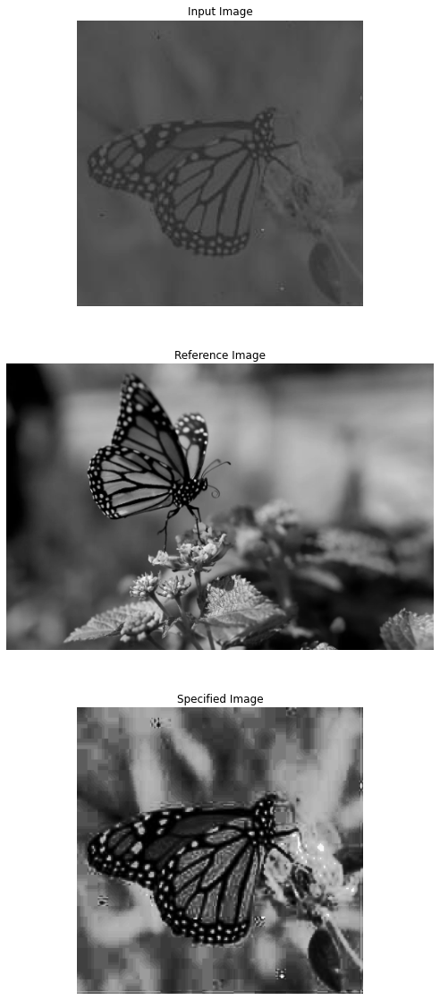

In [315]:
spec_img = histMatching(img1,img2)

f = plt.figure()
f.set_figwidth(35)
f.set_figheight(20)

plt.subplot(311)
plt.axis("off");
plt.title("Input Image")
plt.imshow(img1, vmin=0, vmax=255, cmap = 'gray')

plt.subplot(312)
plt.axis("off");
plt.title("Reference Image")
plt.imshow(img2, vmin=0, vmax=255, cmap = 'gray')

plt.subplot(313)
plt.axis("off");
plt.title("Specified Image")
plt.imshow(spec_img, vmin=0, vmax=255, cmap = 'gray')

plt.show()

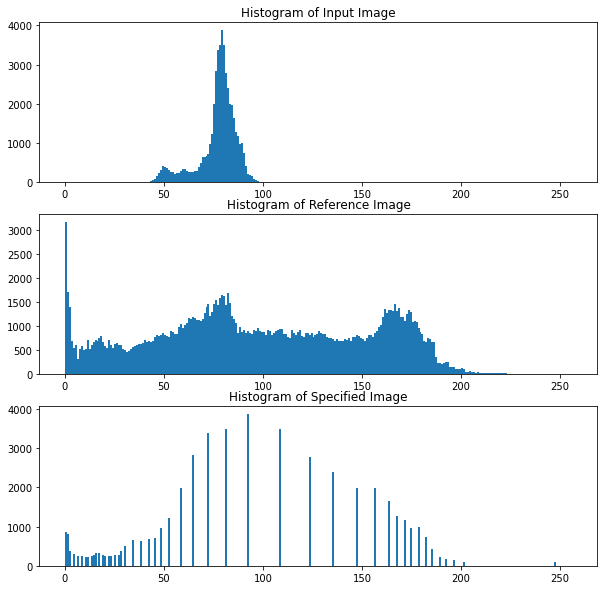

In [316]:
plt.figure()

plt.subplot(311)
plt.title("Histogram of Input Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(img1.ravel(), 256, [0,256])

plt.subplot(312)
plt.title("Histogram of Reference Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(img2.ravel(), 256, [0,256])

plt.subplot(313)
plt.title("Histogram of Specified Image")
plt.gcf().set_size_inches(10, 10)
plt.hist(spec_img.ravel(), 256, [0,256])

plt.show()

# Question 7

## 7.1 Linear Spatial Filter

### 7.1.1 Mean Filter

In [317]:
def meanFilter(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        for j in range(l,col-l):
            sum=0
            for x in range(i-l,i+l+1):
                for y in range(j-l,j+l+1):
                    sum+=img[x][y]
                    
            out_img[i][j] = int(sum/(k**2))
            
    return out_img

In [318]:
img1 = cv2.imread('./Images/testPattern.jpg',0)

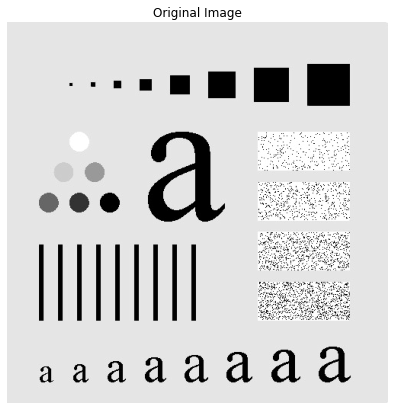

In [319]:
plt.figure()

plt.axis("off");
plt.title("Original Image")
plt.gcf().set_size_inches(7, 7)
plt.imshow(img1, cmap = 'gray')

plt.show()

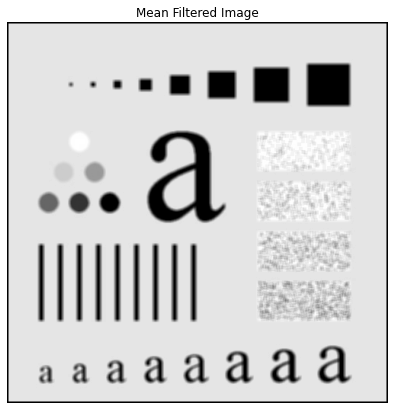

In [320]:
k = 5

filtered_img = meanFilter(img1,k)

plt.figure()

plt.axis("off");
plt.title("Mean Filtered Image")
plt.gcf().set_size_inches(7, 7)
plt.imshow(filtered_img, cmap = 'gray')

plt.show()

In [321]:
import time
start = time.time()
t1 = meanFilter(img1,k)
end = time.time()
print(end-start)

5.997498035430908


In [322]:
def effMeanFilter(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        sum=0
        for x in range(i-l,i+l+1):
            for y in range(0,k):
                sum += img[x][y]

        out_img[i][l] = int(sum/(k**2))
        
        for j in range(l+1,col-l):
            for x in range(i-l,i+l+1):
                sum -= img[x][j-l-1]
                
            for x in range(i-l,i+l+1):
                sum += img[x][j+l]
                
            out_img[i][j] = int(sum/(k**2))
            
    return out_img

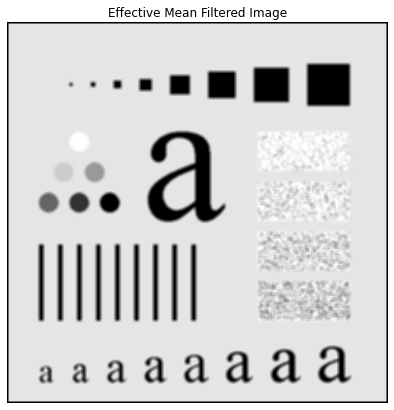

In [323]:
k = 5

eff_filtered_img = effMeanFilter(img1,k)

plt.figure()

plt.axis("off");
plt.title("Effective Mean Filtered Image")
plt.gcf().set_size_inches(7, 7)
plt.imshow(eff_filtered_img, cmap = 'gray')

plt.show()

In [324]:
import time
start = time.time()
t1 = effMeanFilter(img1,k)
end = time.time()
print(end-start)

2.470322370529175


In [325]:
np.array_equal(filtered_img, eff_filtered_img)

True

In [326]:
img64 = cv2.imread('./Images/testImage_64.jpg',0)
img128 = cv2.imread('./Images/testImage_128.jpg',0)
img256 = cv2.imread('./Images/testImage_256.jpg',0)
img1024 = cv2.imread('./Images/testImage_1024.jpg',0)

In [327]:
kernel = np.array([3,5,7,9])

In [328]:
default = np.zeros([4,4])
effective = np.zeros([4,4])

In [329]:
idx=0
for i in range(4):
    st = time.time()
    meanFilter(img64,kernel[i])
    en = time.time()
    default[idx][0] = en-st
    
    st = time.time()
    effMeanFilter(img64,kernel[i])
    en = time.time()
    effective[idx][0] = en-st
    
    st = time.time()
    meanFilter(img128,kernel[i])
    en = time.time()
    default[idx][1] = en-st
    
    st = time.time()
    effMeanFilter(img128,kernel[i])
    en = time.time()
    effective[idx][1] = en-st
    
    st = time.time()
    meanFilter(img256,kernel[i])
    en = time.time()
    default[idx][2] = en-st
    
    st = time.time()
    effMeanFilter(img256,kernel[i])
    en = time.time()
    effective[idx][2] = en-st
    
    st = time.time()
    meanFilter(img1024,kernel[i])
    en = time.time()
    default[idx][3] = en-st
    
    st = time.time()
    effMeanFilter(img1024,kernel[i])
    en = time.time()
    effective[idx][3] = en-st
    
    idx += 1

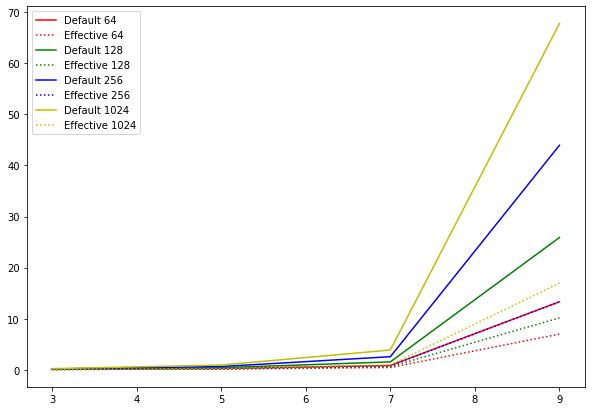

In [330]:
plt.figure()

plt.plot(kernel, default[0,:],'r')
plt.plot(kernel, effective[0,:],'r:')

plt.plot(kernel, default[1,:],'g')
plt.plot(kernel, effective[1,:],'g:')

plt.plot(kernel, default[2,:],'b')
plt.plot(kernel, effective[2,:],'b:')

plt.plot(kernel, default[3,:],'y')
plt.plot(kernel, effective[3,:],'y:')

plt.gcf().set_size_inches(10, 7)
plt.legend(["Default 64", "Effective 64", "Default 128", "Effective 128",
           "Default 256", "Effective 256", "Default 1024", "Effective 1024"])

plt.show()

In [331]:
img = cv2.imread('./Images/testPattern.jpg',0)

In [332]:
img_5 = meanFilter(img, 5)
img_9 = meanFilter(img, 9)
img_15 = meanFilter(img, 15)
img_35 = meanFilter(img, 35)

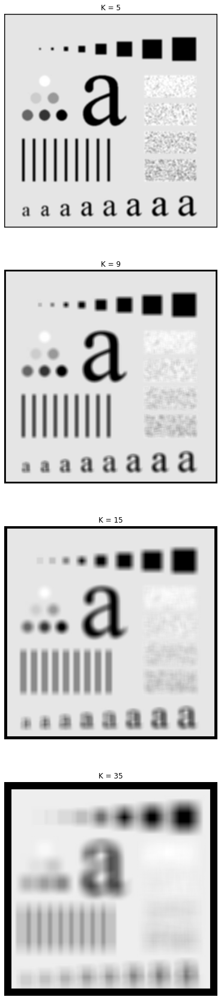

In [333]:
f = plt.figure()
f.set_figwidth(50)
f.set_figheight(30)


plt.subplot(411)
plt.axis("off")
plt.title("K = 5")
plt.imshow(img_5, cmap = 'gray')

plt.subplot(412)
plt.axis("off")
plt.title("K = 9")
plt.imshow(img_9, cmap = 'gray')

plt.subplot(413)
plt.axis("off")
plt.title("K = 15")
plt.imshow(img_15, cmap = 'gray')

plt.subplot(414)
plt.axis("off")
plt.title("K = 35")
plt.imshow(img_35, cmap = 'gray')

plt.show()

In [334]:
h1,b1 = np.histogram(img_5, bins = 256)
h2,b2 = np.histogram(img_9, bins = 256)
h3,b3 = np.histogram(img_15, bins = 256)
h4,b4 = np.histogram(img_35, bins = 256)

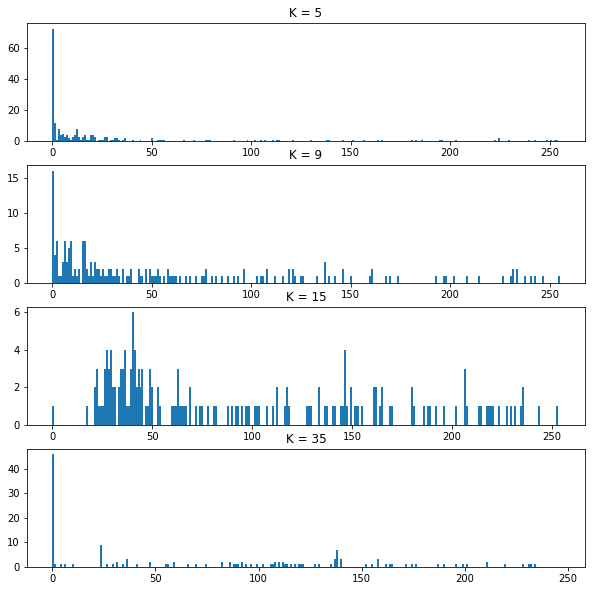

In [335]:
plt.figure()

plt.subplot(411)
plt.title("K = 5")
plt.gcf().set_size_inches(10, 10)
plt.hist(h1,b1)

plt.subplot(412)
plt.title("K = 9")
plt.gcf().set_size_inches(10, 10)
plt.hist(h2,b2)

plt.subplot(413)
plt.title("K = 15")
plt.gcf().set_size_inches(10, 10)
plt.hist(h3,b3)

plt.subplot(414)
plt.title("K = 35")
plt.gcf().set_size_inches(10, 10)
plt.hist(h4,b4)

plt.show()

##### We can observe that as we increase the kernel size the image gets more blurred or smoothed

### 7.1.2 Gaussian Filter

#### 1D Gaussian

In [389]:
def approx1DGaussianFilter1(k):
    arr = np.zeros([k,1])
    
    for i in range(k):
        arr[i][0] = np.math.factorial(k-1)//(np.math.factorial(i)*np.math.factorial(k-1-i))
        
    return arr

In [390]:
def sigma1DGaussian(k):
    arr = approx1DGaussianFilter1(k)
    
    u = np.sum(arr)
    u = u/k
    
    arr = arr-u
    arr = np.square(arr)
    
    var = np.sum(arr)
    var = var/k
    
    return np.sqrt(var)

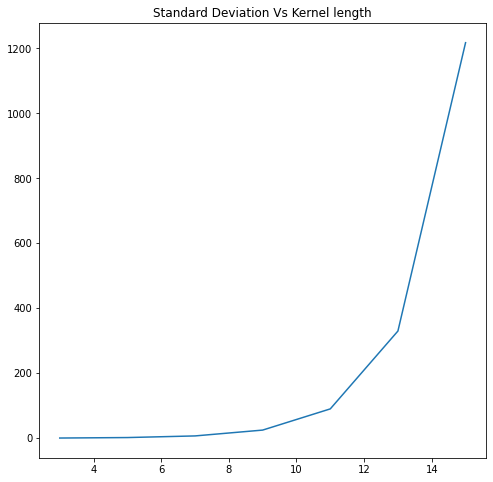

In [338]:
kernel = [3, 5, 7, 9, 11, 13, 15]

sigma = np.zeros(7)

for i in range(7):
    sigma[i] = sigma1DGaussian(kernel[i])
    
plt.figure()

plt.title("Standard Deviation Vs Kernel length")
plt.gcf().set_size_inches(8, 8)
plt.plot(kernel,sigma)

plt.show()

In [391]:
def approx1DGaussFilter2(sigma):
    
    # Size of Kernel
    k1 = round(3*sigma)
    k2 = round(5*sigma)
    k3 = round(7*sigma)
    
    if(k1%2==0):
        k1 += 1
    if(k2%2==0):
        k2 += 1
    if(k3%2==0):
        k3 += 1
    
    # Gaussian kernel
    arr1 = approx1DGaussianFilter1(k1)
    arr2 = approx1DGaussianFilter1(k2)
    arr3 = approx1DGaussianFilter1(k3)
    
    return arr1,k1,arr2,k2,arr3,k3

#### 2D Gaussian 

In [392]:
def gaussKernelGenerator(k, var):
    arr = []
    
    m = int(k/2)
    
    for i in range(k):
        arr.append(i-m)
    
    output = np.zeros([k,k], dtype = float)
    
    for i in range(k):
        for j in range(k):
            x = arr[i]
            y = arr[j]
            
            value = (-1)*(x**2+y**2)/(2*var)
            
            output[i][j] = np.exp(value)
    
    output = output/(2*var*3.14159)
    
    return output

In [393]:
def approx2DGaussFilter(sigma):
    kernel = approx1DGaussFilter2(sigma)[2]
    
    trans_kernel = np.transpose(kernel)
    
    matrix = np.matmul(kernel, trans_kernel)
    
    matrix = matrix/np.sum(matrix)
    
    return matrix

In [342]:
arr = approx2DGaussFilter(1)

print(arr)

[[0.00390625 0.015625   0.0234375  0.015625   0.00390625]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.0234375  0.09375    0.140625   0.09375    0.0234375 ]
 [0.015625   0.0625     0.09375    0.0625     0.015625  ]
 [0.00390625 0.015625   0.0234375  0.015625   0.00390625]]


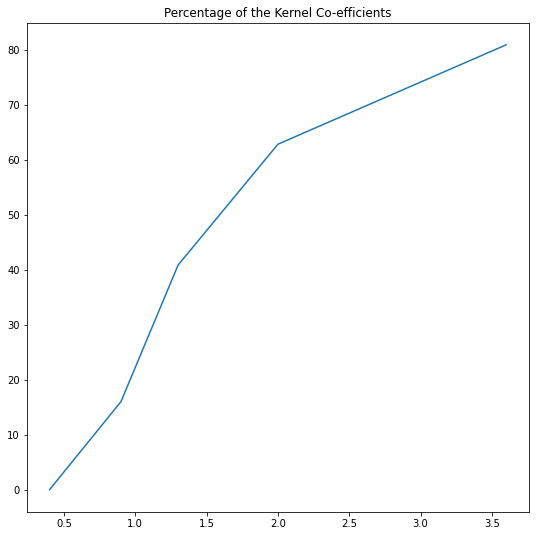

In [343]:
sigma = [0.4, 0.9, 1.3, 2, 3.6]

effective_zero = []

for k in range(5):
    gauss_kernel = approx2DGaussFilter(sigma[k])
    
    row = gauss_kernel.shape[0]
    col = gauss_kernel.shape[1]
    cnt=0
    for i in range(row):
        for j in range(col):
            if (gauss_kernel[i][j] < 1/255.0):
                cnt += 1
    
    effective_zero.append(cnt*100/(gauss_kernel.shape[0]**2))
    
plt.figure()
plt.title("Percentage of the Kernel Co-efficients")
plt.gcf().set_size_inches(9, 9)
plt.plot(sigma, effective_zero)

plt.show()

In [394]:
def gaussianFilter(img, var, k):
    gauss_kernel = gaussKernelGenerator(k, var)
    
    s = np.sum(gauss_kernel)
    gauss_kernel = gauss_kernel/s
    
    row = img.shape[0]
    col = img.shape[1]
    
    m = int(k/2)
    
    out_img = np.zeros([row,col], dtype = int)
    
    for i in range(m,row-m):
        for j in range(m,col-m):
            val=0
            for x in range(i-m,i+m+1):
                for y in range(j-m,j+m+1):
                    val += img[x][y]*gauss_kernel[x-i][y-j]
                    
            out_img[i][j] = val
            
    return out_img

In [345]:
img = cv2.imread('./Images/testPattern.jpg',0)

In [346]:
var1 = 0.15
var2 = 1
var3 = 15

k1 = 5
k2 = 9
k3 = 15
k4 = 35

In [347]:
k_img1 = gaussianFilter(img, var1, k1)
k_img2 = gaussianFilter(img, var1, k2)
k_img3 = gaussianFilter(img, var1, k3)
k_img4 = gaussianFilter(img, var1, k4)

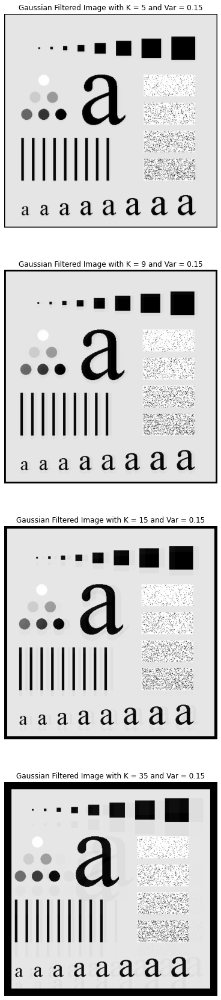

In [348]:
f = plt.figure()
f.set_figwidth(50)
f.set_figheight(30)

plt.subplot(411)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 5 and Var = 0.15")
plt.imshow(k_img1, cmap = 'gray')

plt.subplot(412)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 9 and Var = 0.15")
plt.imshow(k_img2, cmap = 'gray')

plt.subplot(413)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 15 and Var = 0.15")
plt.imshow(k_img3, cmap = 'gray')

plt.subplot(414)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 35 and Var = 0.15")
plt.imshow(k_img4, cmap = 'gray')

plt.show()

##### We can observe that increasing the value of k  result in more blurring and smoothing of the image and comparing to simple mean filter gaussian filter is more effective as the image in gaussian filter get more smooth and less blur.

In [349]:
var_img1 = gaussianFilter(img, var1, k1)
var_img2 = gaussianFilter(img, var2, k1)
var_img3 = gaussianFilter(img, var3, k1)

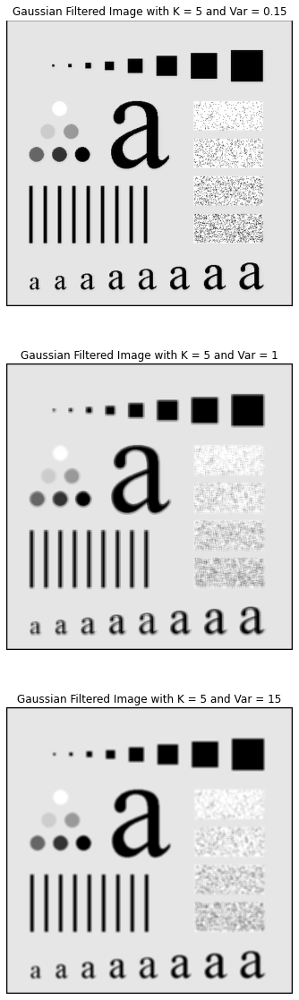

In [350]:
f = plt.figure()
f.set_figwidth(35)
f.set_figheight(20)

plt.subplot(311)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 5 and Var = 0.15")
plt.imshow(var_img1, cmap = 'gray')

plt.subplot(312)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 5 and Var = 1")
plt.imshow(var_img2, cmap = 'gray')

plt.subplot(313)
plt.axis("off");
plt.title("Gaussian Filtered Image with K = 5 and Var = 15")
plt.imshow(var_img3, cmap = 'gray')

plt.show()

##### We can observe that while we increase the variance keeping the kernel size same image will get smooth.

### part d (Bonus)

In [415]:
sigma = 1

k = approx1DGaussFilter2(sigma)[3]

var = sigma**2

kernel1 = approx2DGaussFilter(sigma)
kernel2 = gaussKernelGenerator(k,var)

error = np.mean(np.abs(kernel1 - kernel2))

print(error)

0.0031001615212181517


### part e (Bonus)

In [424]:
sigma = 1

var = sigma**2

k = approx1DGaussFilter2(sigma)[3]

#kernel = approx1DGaussianFilter1(k)

mat1 = approx2DGaussFilter(sigma)

mat1 = mat2/np.sum(mat1)

mat2 = gaussKernelGenerator(k,var)

mat2 = mat2/np.sum(mat2)

print(mat1)
print()
print(mat2)

[[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]

[[0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.02193823 0.09832033 0.16210282 0.09832033 0.02193823]
 [0.01330621 0.0596343  0.09832033 0.0596343  0.01330621]
 [0.00296902 0.01330621 0.02193823 0.01330621 0.00296902]]


## 7.2 Non Linear Filters

In [351]:
def minFilter(img, k):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        for j in range(l,col-l):
            mx = 0
            for x in range(i-l,i+l+1):
                for y in range(j-l,j+l+1):
                    mx = np.maximum(mx,img[x][y])
                    
            out_img[i][j] = mx
            
    return out_img

In [352]:
def maxFilter(img, k):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        for j in range(l,col-l):
            mn = 256
            for x in range(i-l,i+l+1):
                for y in range(j-l,j+l+1):
                    mn = np.minimum(mn,img[x][y])
                    
            out_img[i][j] = mn
            
    return out_img

In [353]:
def medianFilter(img, k):
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        for j in range(l,col-l):
            
            arr = np.array([])
            
            for x in range(i-l,i+l+1):
                for y in range(j-l,j+l+1):
                    arr = np.append(arr, img[x][y])
                    
            med = np.median(arr)
                    
            out_img[i][j] = med
            
    return out_img

In [354]:
img1 = cv2.imread('./Images/noisy1.jpeg',0)
img2 = cv2.imread('./Images/noisy2.jpeg',0)
img3 = cv2.imread('./Images/noisy3.jpeg',0)

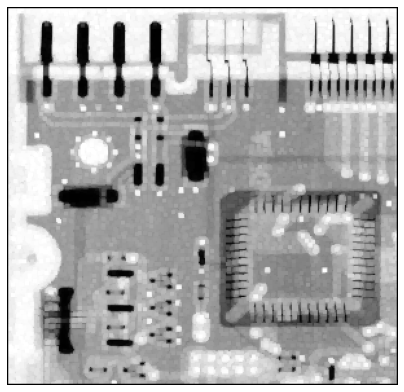

In [355]:
k = 3

min_filtered_img = minFilter(img1,k)

plt.figure()

plt.axis("off");
plt.gcf().set_size_inches(7, 7)
plt.imshow(min_filtered_img, cmap = 'gray')

plt.show()

##### In noisy1 image has pepper error in which we will use min filter which will take max of the sub matrix and equate it to the value of the image pixel

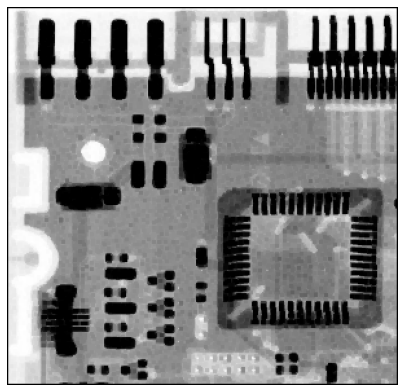

In [356]:
k = 3

max_filtered_img = maxFilter(img2,k)

plt.figure()

plt.axis("off");
plt.gcf().set_size_inches(7, 7)
plt.imshow(max_filtered_img, cmap = 'gray')

plt.show()

##### In noisy2 image has salt error in which we will use max filter which will take min of the sub matrix and equate it to the value of the image pixel

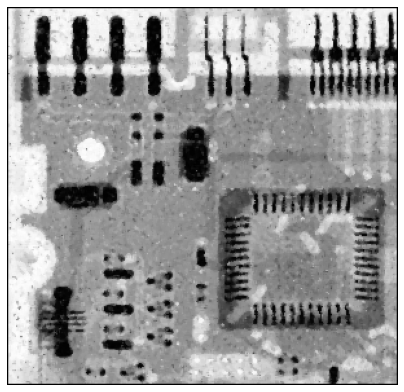

In [357]:
k = 3

median_filtered_img = medianFilter(img3,k)

plt.figure()

plt.axis("off");
plt.gcf().set_size_inches(7, 7)
plt.imshow(median_filtered_img, cmap = 'gray')

plt.show()

##### In noisy3 image has pepper error in which we will use median filter which will take median of the sub matrix and equate it to the value of the image pixel

In [358]:
import time
start = time.time()
t1 = medianFilter(img3,k)
end = time.time()
print(end-start)

17.348937273025513


In [359]:
def effMedianFilter(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        arr = np.array([])
        for y in range(0,k):
            for x in range(i-l,i+l+1):
                arr = np.append(arr, img[x][y])

        med = np.median(arr)
                    
        out_img[i][l] = med
        
        for j in range(l+1,col-l):
            
            idx=0
            
            for x in range(k):
                arr = np.delete(arr,idx)
                
            for x in range(i-l,i+l+1):
                arr = np.append(arr, img[x][j+l])
                
            med = np.median(arr)
                    
            out_img[i][j] = med
            
    return out_img

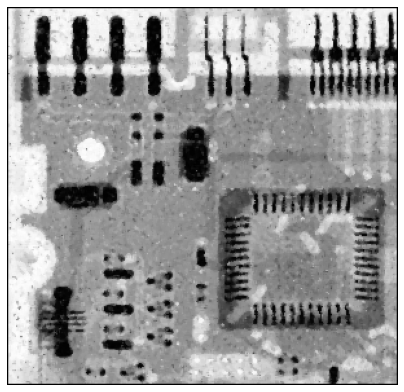

In [360]:
k = 3

eff_median_filtered_img = effMedianFilter(img3,k)

plt.figure()

plt.axis("off");
plt.gcf().set_size_inches(7, 7)
plt.imshow(eff_median_filtered_img, cmap = 'gray')

plt.show()

In [361]:
import time
start = time.time()
t1 = effMedianFilter(img3,k)
end = time.time()
print(end-start)

14.55128002166748


In [362]:
np.array_equal(median_filtered_img, eff_median_filtered_img)

True

## 7.3 Edge Detection

In [363]:
def robert(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    Mx = np.array([[0,1],[-1,0]])
    My = np.array([[1,0],[0,-1]])
    
    for i in range(row-1):
        for j in range(col-1):
            Gx=0
            Gy=0
            
            for x in range(i,i+2):
                for y in range(j,j+2):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
            
            mag_img[i][j] = (np.sqrt(np.square(Gx) + np.square(Gy))).astype(int)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [364]:
def prewitt(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    Mx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    My = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
    
    for i in range(1,row-1):
        for j in range(1,col-1):
            Gx=0
            Gy=0
            
            for x in range(i-1,i+2):
                for y in range(j-1, j+2):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                    
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [365]:
def sobel(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    Mx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    My = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
    
    for i in range(1,row-1):
        for j in range(1,col-1):
            Gx=0
            Gy=0
            
            for x in range(i-1,i+2):
                for y in range(j-1, j+2):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [366]:
def laplacian1(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    Mx = np.array([[0,0,0],[1,-2,1],[0,0,0]])
    My = np.array([[0,1,0],[0,-2,0],[0,1,0]])
    
    for i in range(1,row-1):
        for j in range(1,col-1):
            Gx=0
            Gy=0
            
            for x in range(i-1,i+2):
                for y in range(j-1, j+2):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [367]:
def laplacian2(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    Mx = np.array([[0.5,0,0.5],[1,-4,1],[0.5,0,0.5]])
    My = np.array([[0.5,1,0.5],[0,-4,0],[0.5,1,0.5]])
    
    for i in range(1,row-1):
        for j in range(1,col-1):
            Gx=0
            Gy=0
            
            for x in range(i-1,i+2):
                for y in range(j-1, j+2):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [368]:
img1 = cv2.imread('./Images/office.jpg',0)

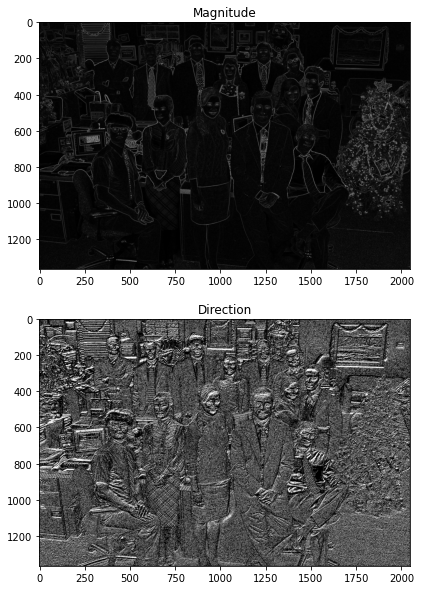

In [369]:
[magnitude, direction] = robert(img1)

plt.figure()

plt.subplot(211)
plt.title("Magnitude")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude, cmap = 'gray')

plt.subplot(212)
plt.title("Direction")
plt.gcf().set_size_inches(10, 10)
plt.imshow(direction, cmap = 'gray')

plt.show()

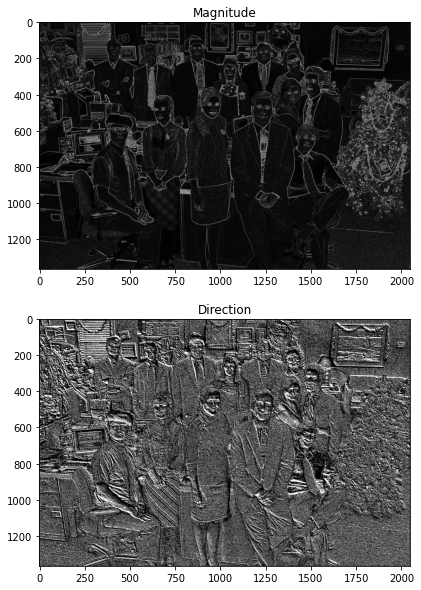

In [370]:
[magnitude, direction] = prewitt(img1)

plt.figure()

plt.subplot(211)
plt.title("Magnitude")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude, cmap = 'gray')

plt.subplot(212)
plt.title("Direction")
plt.gcf().set_size_inches(10, 10)
plt.imshow(direction, cmap = 'gray')

plt.show()

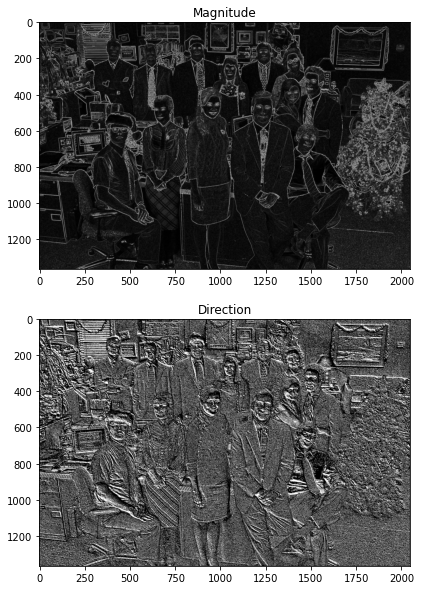

In [371]:
[magnitude, direction] = sobel(img1)

plt.figure()

plt.subplot(211)
plt.title("Magnitude")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude, cmap = 'gray')

plt.subplot(212)
plt.title("Direction")
plt.gcf().set_size_inches(10, 10)
plt.imshow(direction, cmap = 'gray')

plt.show()

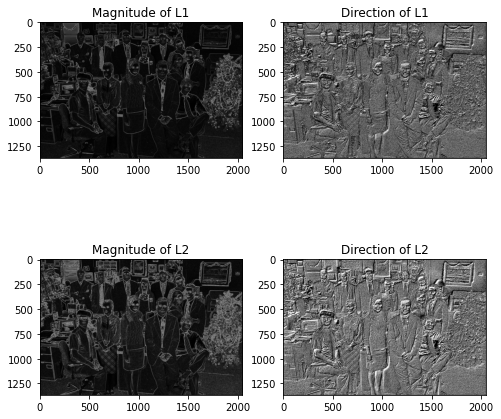

In [372]:
[magnitude1, direction1] = laplacian1(img1)
[magnitude2, direction2] = laplacian2(img1)

plt.figure()

plt.subplot(221)
plt.title("Magnitude of L1")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude1, cmap = 'gray')

plt.subplot(222)
plt.title("Direction of L1")
plt.gcf().set_size_inches(8, 8)
plt.imshow(direction1, cmap = 'gray')

plt.subplot(223)
plt.title("Magnitude of L2")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude2, cmap = 'gray')

plt.subplot(224)
plt.title("Direction of L2")
plt.gcf().set_size_inches(8, 8)
plt.imshow(direction2, cmap = 'gray')

plt.show()

##### Edge detection is more accurate as compared to robert and prewitt while prewitt is better than robert
##### And comparing the two laplacian filters, L2 is better in edge detection than L1

In [373]:
def sobel5(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    My = np.array([[-2,-1,0,1,2],[-2,-1,0,1,2],[-4,-2,0,2,4],[-2,-1,0,1,2],[-2,-1,0,1,2]])
    Mx = np.array([[2,2,4,2,2],[1,1,2,1,1],[0,0,0,0,0],[-1,-1,-2,-1,-1],[-2,-2,-4,-2,-2]])
    
    for i in range(2,row-2):
        for j in range(2,col-2):
            Gx=0
            Gy=0
            
            for x in range(i-2,i+3):
                for y in range(j-2, j+3):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

In [374]:
def prewitt5(img):
    
    row = img.shape[0]
    col = img.shape[1]
    
    mag_img = np.zeros([row,col], dtype = object)
    dir_img = np.zeros([row,col], dtype = object)
    
    My = np.array([[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2],[-2,-1,0,1,2]])
    Mx = np.array([[2,2,2,2,2],[1,1,1,1,1],[0,0,0,0,0],[-1,-1,-1,-1,-1],[-2,-2,-2,-2,-2]])
    
    for i in range(2,row-2):
        for j in range(2,col-2):
            Gx=0
            Gy=0
            
            for x in range(i-2,i+3):
                for y in range(j-2, j+3):
                    Gx += Mx[x-i][y-j]*img[x][y]
                    Gy += My[x-i][y-j]*img[x][y]
                
            mag_img[i][j] = np.sqrt(Gx**2 + Gy**2)
            dir_img[i][j] = np.arctan2(Gy,Gx)
            
    return mag_img.astype(np.uint8), dir_img.astype(np.uint8)

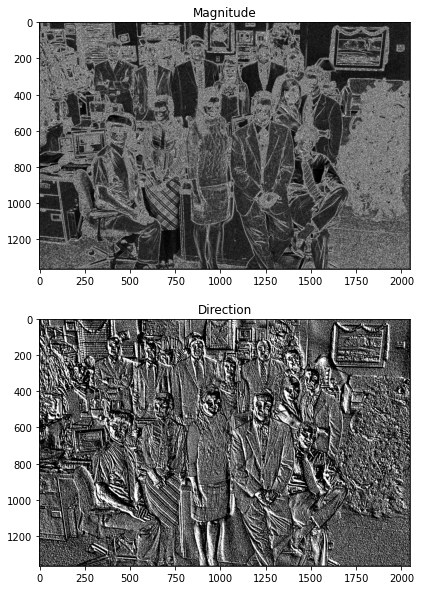

In [375]:
[magnitude, direction] = sobel5(img1)

plt.figure()

plt.subplot(211)
plt.title("Magnitude")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude, cmap = 'gray')

plt.subplot(212)
plt.title("Direction")
plt.gcf().set_size_inches(10, 10)
plt.imshow(direction, cmap = 'gray')

plt.show()

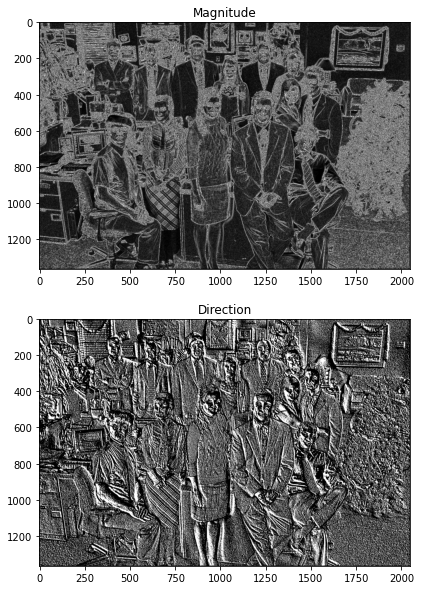

In [376]:
[magnitude, direction] = prewitt5(img1)

plt.figure()

plt.subplot(211)
plt.title("Magnitude")
plt.gcf().set_size_inches(10, 10)
plt.imshow(magnitude, cmap = 'gray')

plt.subplot(212)
plt.title("Direction")
plt.gcf().set_size_inches(10, 10)
plt.imshow(direction, cmap = 'gray')

plt.show()

##### By comparing the filters with different kernel sizes we can observe that as we increase the kernel size, edge detection becomes more accurate.

# Question 8

In [468]:
img = cv2.imread('./Images/galaxies.jpeg',0)

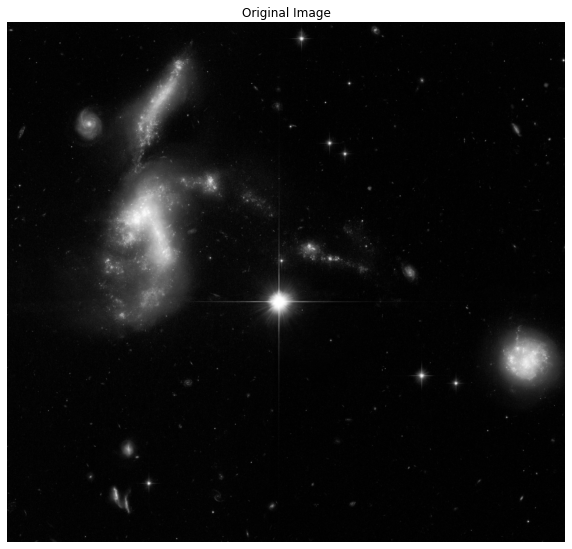

In [378]:
plt.figure()

plt.axis("off")
plt.title("Original Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img, cmap = 'gray')

plt.show()

In [469]:
def effMaxFilter(img,k):
    
    row = img.shape[0]
    col = img.shape[1]
    
    out_img = np.zeros([row,col], dtype=int)
    
    l = int(k/2)
    
    for i in range(l,row-l):
        arr = []
        for y in range(0,k):
            for x in range(i-l,i+l+1):
                arr.append(img[x][y])

        mn = min(arr)
                    
        out_img[i][l] = mn
        
        for j in range(l+1,col-l):
            
            idx=0
            
            for x in range(k):
                arr.pop(idx)
                
            for x in range(i-l,i+l+1):
                arr.append(img[x][j+l])
                
            mn = min(arr)
                    
            out_img[i][j] = mn
            
    return out_img

In [470]:
img1 = effMaxFilter(img, 15) 

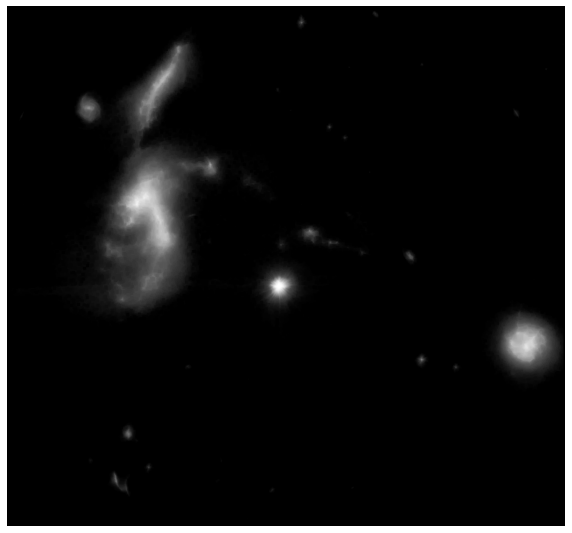

In [471]:
plt.figure()

plt.axis("off")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img1, cmap = 'gray')

plt.show()

In [472]:
a = np.array([0,0.4])
b = np.array([0.4,1])
k1 = np.array([0,0])
k2 = np.array([0.2,1])

img1 = img1/255
img2 = piecewiseLinTransform(a,b,k1,k2,img1)
img2 = img2*255

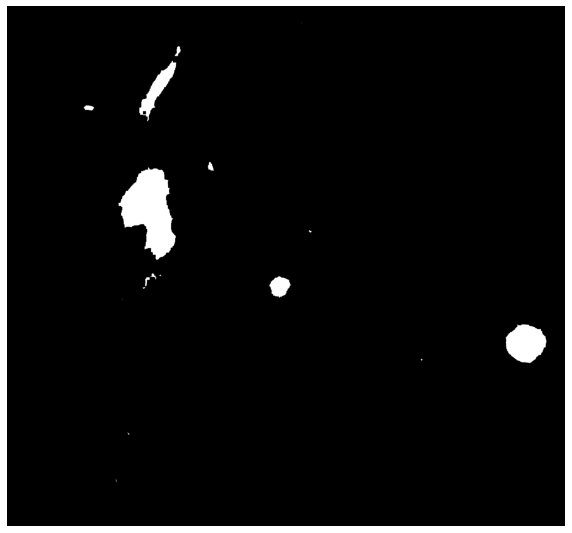

In [473]:
plt.figure()

plt.axis("off")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img2, cmap = 'gray')

plt.show()

In [474]:
img3 = effMaxFilter(img2,13)

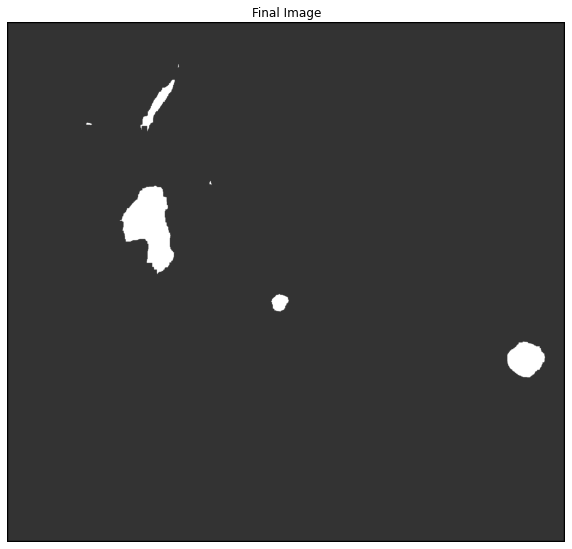

In [475]:
plt.figure()

plt.axis("off")
plt.title("Final Image")
plt.gcf().set_size_inches(10, 10)
plt.imshow(img3, cmap = 'gray')

plt.show()